# HEART DISEASE PREDICTION

In [1]:
# Importing the required libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Loading the dataset
df_data = pd.read_csv("DataH.csv")
df_target = pd.read_csv("TargetH.csv")

In [3]:
# Merging both the files together
df = pd.merge(df_data, df_target) 

# Check first 5 rows of our dataset
df.head()

,patient_id,slope_of_peak_exercise_st_segment,thal,resting_blood_pressure,chest_pain_type,num_major_vessels,fasting_blood_sugar_gt_120_mg_per_dl,resting_ekg_results,serum_cholesterol_mg_per_dl,oldpeak_eq_st_depression,sex,age,max_heart_rate_achieved,exercise_induced_angina,heart_disease_present
0,0z64un,1,normal,128,2,0,0,2,308,0.0,1,45,170,0,0
1,ryoo3j,2,normal,110,3,0,0,0,214,1.6,0,54,158,0,0
2,yt1s1x,1,normal,125,4,3,0,2,304,0.0,1,77,162,1,1
3,l2xjde,1,reversible_defect,152,4,0,0,0,223,0.0,1,40,181,0,1
4,oyt4ek,3,reversible_defect,178,1,0,0,2,270,4.2,1,59,145,0,0


In [8]:
pd.set_option('display.max_rows', None)
df['patient_id'].value_counts()

gla0im    1
nsd00i    1
4b32pd    1
nizd9c    1
l0c19s    1
24fopx    1
qwj1yf    1
k8899q    1
lek9q9    1
usnkhx    1
08usun    1
wze8qm    1
3wl3z4    1
6r9x2j    1
isq8yp    1
k1art8    1
3drd48    1
7kf275    1
cpqg4x    1
8c36yw    1
7uch9x    1
hfp05i    1
3nwy2n    1
strmq8    1
qhz9ye    1
p5orwa    1
6219kl    1
qvhk9e    1
ewckbx    1
igwnqo    1
rp9g6x    1
6017a1    1
jscmp8    1
bthqr4    1
z8yl4y    1
ldg4b9    1
rfj25e    1
dtljkq    1
0g192k    1
bv01fp    1
fz84ac    1
1ennzl    1
dy5hxt    1
tpuevg    1
shiro4    1
pjgqa3    1
0ryxtv    1
2fqzg8    1
ldr1mz    1
1wwvr0    1
9upsjl    1
7zbya5    1
zlyac8    1
7eyvsi    1
30v796    1
drdvf9    1
i49srr    1
qcjf51    1
e68djo    1
y3m2bd    1
mpggsq    1
2fv3rc    1
a2kf1z    1
98kb5h    1
syvayq    1
hh2awp    1
4sd1xn    1
f06u72    1
zaytyf    1
ebioez    1
1r508r    1
jwqi3k    1
oyt4ek    1
w3933i    1
hltlsl    1
ebloe5    1
qyrkxn    1
hlmts5    1
c0gkqc    1
fzzkh7    1
ldukkw    1
1xwoe6    1
j9tw19    1
e3dn

# Exploratory Data Analysis and Data Preprocessing

NumExpr defaulting to 4 threads.


  0%|                                                                                         | 0/2111 [00:00<…

DataPrep Report
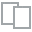
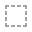
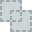
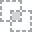
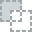
...
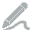
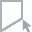
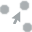
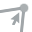
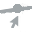

In [4]:
# 'create_report' is used to generate profile reports from a pandas DataFrame.
# It utilizes the functionalities and formats the plots from dataprep.

from dataprep.eda import create_report
create_report(df)

In [10]:
# We dropped the Patient_ID column, as it is not needed for our analysis
df.drop('patient_id', axis = 1, inplace=True)

df

,slope_of_peak_exercise_st_segment,thal,resting_blood_pressure,chest_pain_type,num_major_vessels,fasting_blood_sugar_gt_120_mg_per_dl,resting_ekg_results,serum_cholesterol_mg_per_dl,oldpeak_eq_st_depression,sex,age,max_heart_rate_achieved,exercise_induced_angina,heart_disease_present
0,1,normal,128,2,0,0,2,308,0.0,1,45,170,0,0
1,2,normal,110,3,0,0,0,214,1.6,0,54,158,0,0
2,1,normal,125,4,3,0,2,304,0.0,1,77,162,1,1
3,1,reversible_defect,152,4,0,0,0,223,0.0,1,40,181,0,1
4,3,reversible_defect,178,1,0,0,2,270,4.2,1,59,145,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,2,reversible_defect,125,4,2,1,0,254,0.2,1,67,163,0,1
176,2,normal,180,4,0,0,1,327,3.4,0,55,117,1,1
177,2,reversible_defect,125,3,0,0,0,309,1.8,1,64,131,1,1
178,1,normal,124,3,2,1,0,255,0.0,1,48,175,0,0


# Handling Categorical Value

In [11]:
# we have converted categorical data into numerical data using label encoding 
from sklearn.preprocessing import LabelEncoder 
le = LabelEncoder()

df.thal = le.fit_transform(df.thal)
df

,slope_of_peak_exercise_st_segment,thal,resting_blood_pressure,chest_pain_type,num_major_vessels,fasting_blood_sugar_gt_120_mg_per_dl,resting_ekg_results,serum_cholesterol_mg_per_dl,oldpeak_eq_st_depression,sex,age,max_heart_rate_achieved,exercise_induced_angina,heart_disease_present
0,1,1,128,2,0,0,2,308,0.0,1,45,170,0,0
1,2,1,110,3,0,0,0,214,1.6,0,54,158,0,0
2,1,1,125,4,3,0,2,304,0.0,1,77,162,1,1
3,1,2,152,4,0,0,0,223,0.0,1,40,181,0,1
4,3,2,178,1,0,0,2,270,4.2,1,59,145,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,2,2,125,4,2,1,0,254,0.2,1,67,163,0,1
176,2,1,180,4,0,0,1,327,3.4,0,55,117,1,1
177,2,2,125,3,0,0,0,309,1.8,1,64,131,1,1
178,1,1,124,3,2,1,0,255,0.0,1,48,175,0,0


In [8]:
df.corr()

,slope_of_peak_exercise_st_segment,thal,resting_blood_pressure,chest_pain_type,num_major_vessels,fasting_blood_sugar_gt_120_mg_per_dl,resting_ekg_results,serum_cholesterol_mg_per_dl,oldpeak_eq_st_depression,sex,age,max_heart_rate_achieved,exercise_induced_angina,heart_disease_present
slope_of_peak_exercise_st_segment,1.000000,0.154101,0.098287,0.121207,0.076832,0.050199,0.172191,-0.032348,0.615948,0.093340,0.169918,-0.418102,0.225459,0.344224
thal,0.154101,1.000000,-0.006088,0.269583,0.174107,-0.070225,-0.052171,0.046448,0.251972,0.265420,-0.007934,-0.142098,0.360395,0.447214
resting_blood_pressure,0.098287,-0.006088,1.000000,-0.029296,0.042388,0.166570,0.078986,0.144881,0.219026,-0.055589,0.284402,-0.017521,0.123397,0.078506
chest_pain_type,0.121207,0.269583,-0.029296,1.000000,0.249061,-0.088992,0.033379,0.061213,0.080799,0.086057,0.085001,-0.301792,0.346266,0.412829
num_major_vessels,0.076832,0.174107,0.042388,0.249061,1.000000,0.169792,0.096656,0.098348,0.214062,0.073107,0.347355,-0.275687,0.153407,0.421519
fasting_blood_sugar_gt_120_mg_per_dl,0.050199,-0.070225,0.166570,-0.088992,0.169792,1.000000,0.053864,0.027560,-0.039055,0.066010,0.176101,0.058369,-0.005956,0.003379
resting_ekg_results,0.172191,-0.052171,0.078986,0.033379,0.096656,0.053864,1.000000,0.170839,0.097321,0.045786,0.126856,-0.102766,0.037773,0.145933
serum_cholesterol_mg_per_dl,-0.032348,0.046448,0.144881,0.061213,0.098348,0.027560,0.170839,1.000000,-0.021932,-0.152296,0.236211,-0.071038,0.083139,0.079775
oldpeak_eq_st_depression,0.615948,0.251972,0.219026,0.080799,0.214062,-0.039055,0.097321,-0.021932,1.000000,0.099374,0.189700,-0.341045,0.249167,0.382930
sex,0.093340,0.265420,-0.055589,0.086057,0.073107,0.066010,0.045786,-0.152296,0.099374,1.000000,-0.148997,-0.053960,0.251096,0.335421



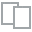
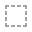
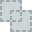
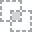
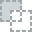
...
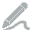
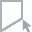
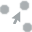
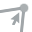
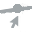

In [8]:
# To find the correlation between columns
from dataprep.eda import plot_correlation
plot_correlation(df)

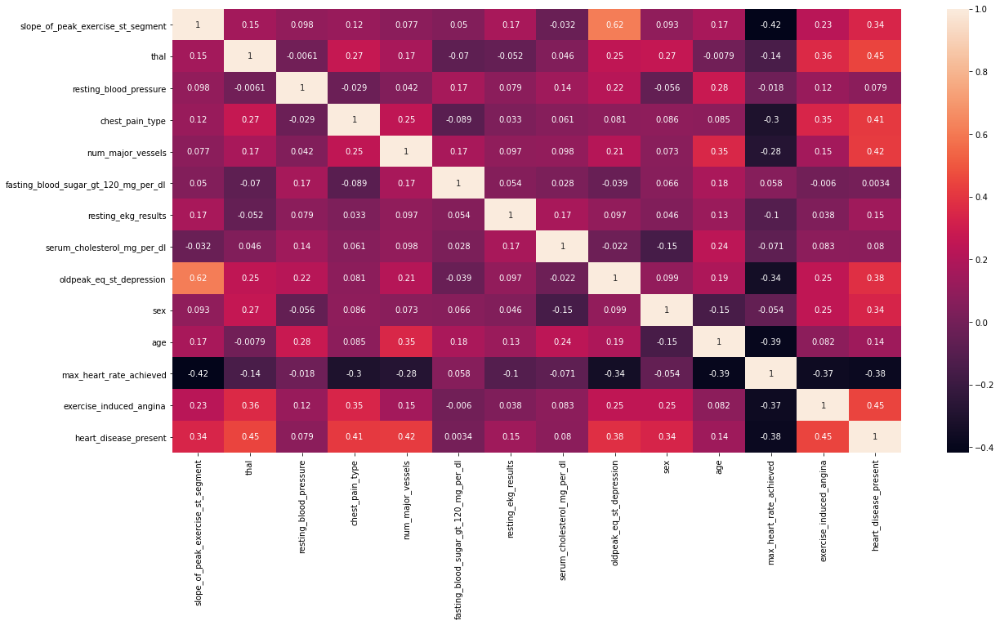

In [9]:
plt.figure(figsize = (20, 10))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [10]:
df["heart_disease_present"].value_counts()

0    100
1     80
Name: heart_disease_present, dtype: int64

#### We have 100 people without heart disease and 80 people with heart disease, which is almost near.. so our data is balanced.

## Check correlation with the target variable

<AxesSubplot:title={'center':'Correlation with target'}>

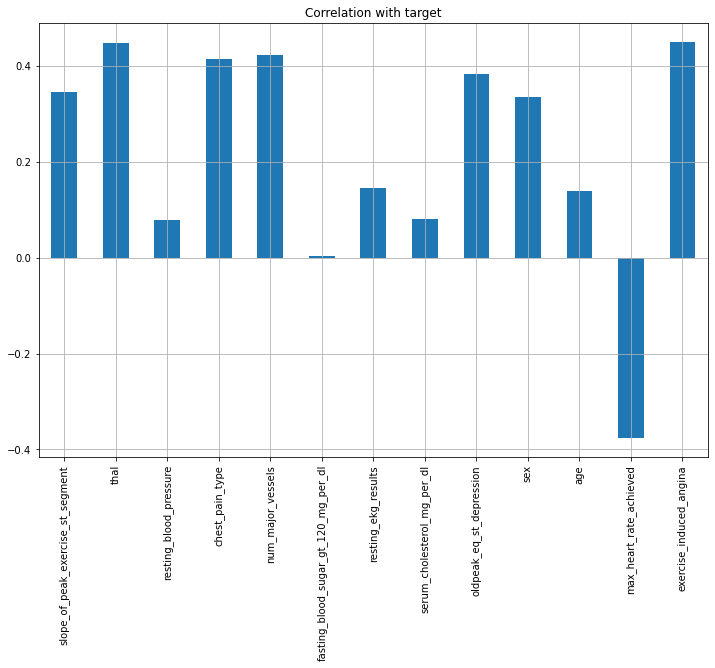

In [11]:
df.drop('heart_disease_present', axis=1).corrwith(df.heart_disease_present).plot(kind='bar', grid=True, figsize=(12, 8), title="Correlation with target")

### - Resting_blood_pressure, fasting blood sugar, serum_cholesterol are the least correlated variables with the target variable.

### - All other variables have a significant correlation with the target variable.

# Checking the presence of OUTLIERS in the data

<AxesSubplot:xlabel='num_major_vessels'>

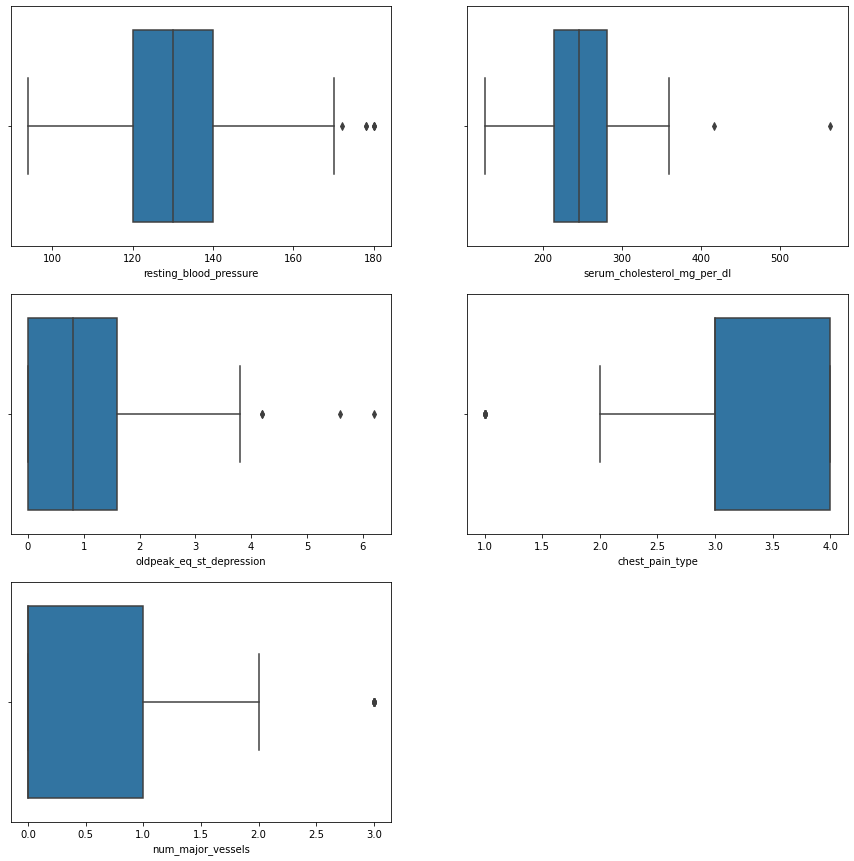

In [12]:
plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
sns.boxplot(df.resting_blood_pressure)
plt.subplot(3,2,2)
sns.boxplot(df.serum_cholesterol_mg_per_dl)
plt.subplot(3,2,3)
sns.boxplot(df.oldpeak_eq_st_depression)
plt.subplot(3,2,4)
sns.boxplot(df.chest_pain_type),  
plt.subplot(3,2,5)
sns.boxplot(df.num_major_vessels)

In [12]:
df_n = df.copy() 

In [13]:
# Handling outliers

# resting_blood_pressure
Q1_r = np.percentile(df_n['resting_blood_pressure'], 25, interpolation = 'midpoint')  
Q3_r = np.percentile(df_n['resting_blood_pressure'], 75, interpolation = 'midpoint') 
IQR_r = Q3_r - Q1_r
print("IQR for Resting Blood Pressure: ", IQR_r) 


# serum_cholesterol_mg_per_dl
Q1_s = np.percentile(df_n['serum_cholesterol_mg_per_dl'], 25, interpolation = 'midpoint')  
Q3_s = np.percentile(df_n['serum_cholesterol_mg_per_dl'], 75, interpolation = 'midpoint') 
IQR_s = Q3_s - Q1_s
print("IQR for Serum Cholesterol: ", IQR_s)


# oldpeak_eq_st_depression
Q1_o = np.percentile(df_n['oldpeak_eq_st_depression'], 25, interpolation = 'midpoint') 
Q3_o = np.percentile(df_n['oldpeak_eq_st_depression'], 75, interpolation = 'midpoint') 
IQR_o = Q3_o - Q1_o  
print("IQR for Oldpeak Eq St Depression: ", IQR_o)

IQR for Resting Blood Pressure:  20.0
IQR for Serum Cholesterol:  68.0
IQR for Oldpeak Eq St Depression:  1.6


In [14]:
# the upper and lower limit of the above features

low_limit_r = Q1_r - 1.5*IQR_r
upp_limit_r = Q3_r + 1.5*IQR_r

low_limit_s = Q1_s - 1.5*IQR_s
upp_limit_s = Q3_s + 1.5*IQR_s

low_limit_o = Q1_o - 1.5*IQR_o
upp_limit_o = Q3_o + 1.5*IQR_o

In [15]:
low_limit_r, upp_limit_r

(90.0, 170.0)

In [16]:
low_limit_s, upp_limit_s

(111.5, 383.5)

In [17]:
low_limit_o, upp_limit_o

(-2.4000000000000004, 4.0)

In [18]:
#Imputing the outliers with median for the above features

df_n.loc[df_n['resting_blood_pressure'] > upp_limit_r,'resting_blood_pressure']=np.median(df_n.resting_blood_pressure)
df_n.loc[df_n['serum_cholesterol_mg_per_dl'] > upp_limit_s,'serum_cholesterol_mg_per_dl']=np.median(df_n.serum_cholesterol_mg_per_dl)
df_n.loc[df_n['oldpeak_eq_st_depression'] > upp_limit_o,'oldpeak_eq_st_depression']=np.median(df_n.oldpeak_eq_st_depression)

<AxesSubplot:xlabel='oldpeak_eq_st_depression'>

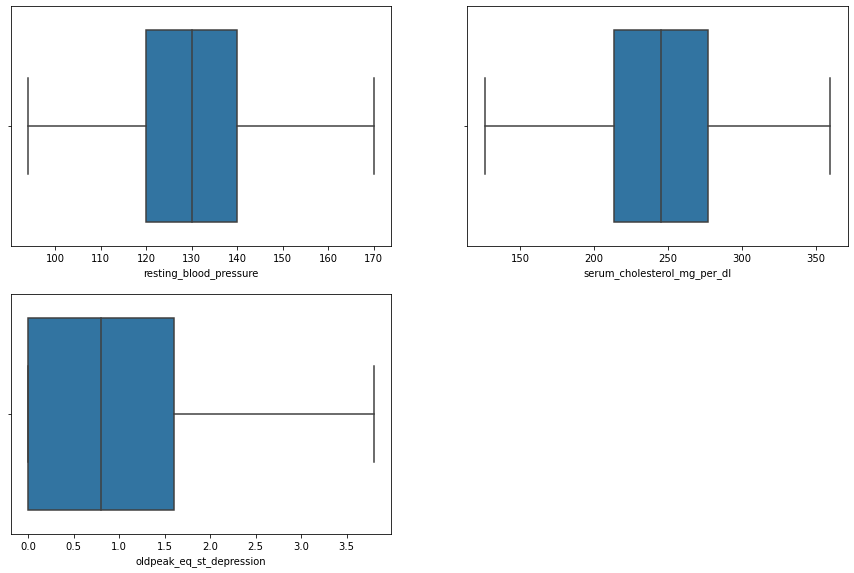

In [19]:
#checking for outliers


plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
sns.boxplot(df_n.resting_blood_pressure)
plt.subplot(3,2,2)
sns.boxplot(df_n.serum_cholesterol_mg_per_dl)
plt.subplot(3,2,3)
sns.boxplot(df_n.oldpeak_eq_st_depression)


# Splitting the Dataset for Training and Testing

In [20]:
X = df_n.drop('heart_disease_present', axis = 1)
y = df_n.heart_disease_present
#X.shape
y.shape

(180,)

In [21]:
# 80% of data has been taken for Training and 20% for testing

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=50)

# Applying ML Algorithms

In [23]:
# 1. Logistic Regression

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
mod=LogisticRegression()               
mod.fit(X_train,y_train)               
y_pred=mod.predict(X_test)     
accuracy_score(y_test,y_pred) 



0.9166666666666666

In [24]:
# 2. Support Vector Classifier

from sklearn.svm import SVC
sv_mod=SVC(kernel='linear', random_state=42)
sv_mod.fit(X_train,y_train)
pred = sv_mod.predict(X_test)

accuracy_score(y_test, pred)

0.9166666666666666

In [35]:
# 3. RandomForest Classifier

from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

mod = RandomForestClassifier(n_estimators=50, random_state=42)
mod.fit(X_train, y_train)
y_p = mod.predict(X_test)

print(accuracy_score(y_test, y_p))

0.8888888888888888


In [26]:
# 4. Decision Tree Classifier

from sklearn.tree import DecisionTreeClassifier
dt_mod=DecisionTreeClassifier(max_depth=10, random_state=25)
dt_mod.fit(X_train,y_train)
y_pred=dt_mod.predict(X_test)
accuracy_score(y_test,y_pred)

0.8333333333333334

In [50]:
# 5. KNeighbors Classifier

from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=35)
knn.fit(X_train,y_train)
pred=knn.predict(X_test)
accuracy_score(y_test,pred)

0.6944444444444444

### Hyper Parameter Tuning using GridSearchCV

In [36]:
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 

  
grid = GridSearchCV(sv_mod, param_grid, refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END ..................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=0.1, gamma=0.0

[CV 4/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END ....................C=1000, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 4/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 5/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 1/5] END ...............

GridSearchCV(estimator=SVC(kernel='linear', random_state=42),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [37]:
print("The best parameters are: ", grid.best_params_)

The best parameters are:  {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}


In [38]:
grid.best_score_

0.7014778325123153

#### Conclusion:
#### In the research conducted using the dataset for heart diseases which contains 180 instances and 15 attributes, implementing 5 different algorithms, we concluded that Logistic Regression Model and SVC Model can give the maximum accuracy of 91.67 %.  So for this data set, LogisticRegression and SVC are the best Models. Using GridSearch for SVC model has not improved the accuracy. So hyper tuning is not needed.

#### The experiments were carried out using 3 more models and were trained and tested with maximum accuracy of K Neighbors Classifier: 69%, Decision Tree Classifier: 83% and Random Forest Classifier:88%.